## MA5852 Assessment 3 - Capstone Report
### Notebook 2 - Transfer Learning

The model that is going to be used for the transfer learning component is version 3 of the Inception network. More information about this network can be found at: https://keras.io/api/applications/.

Note the core of the model is being retained, including all the model weights etc. The only thing being changed are the output layers to ensure that the model can predict on this dataset.

#### Part 1: Model Training

Recall that the training and validation data has already been created in the previous notebook.

In [1]:
%%sh
ls -l

total 46012
drwxr-xr-x 4 ec2-user ec2-user     4096 Jun 14 00:28 1
drwxr-xr-x 4 ec2-user ec2-user     4096 Jun 15 23:02 2
-rw-rw-r-- 1 ec2-user ec2-user     5157 May 30 07:16 A2_baseline ANN model script.py
-rw-rw-r-- 1 ec2-user ec2-user     4434 May 31 05:26 A2_batch normalised ANN model script.py
-rw-rw-r-- 1 ec2-user ec2-user    85951 May 31 01:21 A2 Notebook 1.ipynb
-rw-rw-r-- 1 ec2-user ec2-user 11921804 Jun 12 10:27 A2 Notebook 2.ipynb
-rw-rw-r-- 1 ec2-user ec2-user  4552874 May 31 06:58 A2 Notebook 3.ipynb
-rw-rw-r-- 1 ec2-user ec2-user     4987 May 31 06:03 A2_regularised ANN model script.py
-rw-rw-r-- 1 ec2-user ec2-user     9303 Jun 16 05:57 A3_baseline CNN model script.py
-rw-rw-r-- 1 ec2-user ec2-user     9115 Jun 15 23:53 A3_baseline CNN model script-v2.py
-rw-rw-r-- 1 ec2-user ec2-user     7850 Jun 16 06:11 A3_inception model script.py
-rw-rw-r-- 1 ec2-user ec2-user  1412704 Jun 16 01:23 A3 Notebook 1.ipynb
-rw-rw-r-- 1 ec2-user ec2-user 29012619 Jun 16 06:03 A3 Notebook 

In [1]:
# import the necessary libraries for this section
import sagemaker
import tensorflow as tf
import time

from sagemaker.tensorflow import TensorFlow

In [2]:
# define environment variables
sess = sagemaker.Session()
role = sagemaker.get_execution_role()
bucket = sess.default_bucket()
prefix = "A3"
tensorflow_logs_path = "s3://{}/{}/logs".format(bucket, prefix)
training_input_path = "s3://{}/{}/input/train".format(bucket, prefix)
validation_input_path = "s3://{}/{}/input/val".format(bucket, prefix)
output_path = "s3://{}/{}/output".format(bucket, prefix)

print("SageMaker ver: " + sagemaker.__version__)
print("Tensorflow ver: " + tf.__version__)
print("Bucket: {}".format(bucket))
print("Logs path: " + tensorflow_logs_path)
print("Training data location: " + training_input_path)
print("Validation data location: " + validation_input_path)
print("Output path: " + output_path)

SageMaker ver: 2.41.0
Tensorflow ver: 1.15.5
Bucket: sagemaker-ap-southeast-2-987959606453
Logs path: s3://sagemaker-ap-southeast-2-987959606453/A3/logs
Training data location: s3://sagemaker-ap-southeast-2-987959606453/A3/input/train
Validation data location: s3://sagemaker-ap-southeast-2-987959606453/A3/input/val
Output path: s3://sagemaker-ap-southeast-2-987959606453/A3/output


In [4]:
# define the metrics to be sent to CloudWatch
metric_definitions = [
    {'Name': 'training_loss',        'Regex': 'loss: ([0-9\\.]+)'},
    {'Name': 'training_accuracy',    'Regex': 'accuracy: ([0-9\\.]+)'},
    {'Name': 'training_precision',   'Regex': 'precision: ([0-9\\.]+)'},
    {'Name': 'training_recall',      'Regex': 'recall: ([0-9\\.]+)'},
    {'Name': 'training_auc',         'Regex': 'auc: ([0-9\\.]+)'},
    {'Name': 'validation_loss',      'Regex': 'val_loss: ([0-9\\.]+)'},
    {'Name': 'validation_accuracy',  'Regex': 'val_accuracy: ([0-9\\.]+)'},
    {'Name': 'validation_precision', 'Regex': 'val_precision: ([0-9\\.]+)'},
    {'Name': 'validation_recall',    'Regex': 'val_recall: ([0-9\\.]+)'},
    {'Name': 'validation_auc',       'Regex': 'val_auc: ([0-9\\.]+)'},
]

In [24]:
# configure the estimator
tf_estimator = TensorFlow(
    entry_point = 'A3_inception model script.py',
    role = role,
    source_dir = '.',
    instance_count = 1,
    instance_type = 'ml.p2.xlarge',    # the most powerful EC2 instance available to the author
    framework_version = '2.1.0',
    py_version = 'py3',
    script_mode = True,
    hyperparameters = {'tf-logs-path': tensorflow_logs_path},
    metric_definitions = metric_definitions,
    output_path = output_path)

# and give it a name
training_job_name = 'A3-inception-training-job-'+ time.strftime("%Y-%m-%d-%H-%M-%S", time.gmtime())

In [25]:
# fit the model in SageMaker
inputs = {'training': training_input_path,
          'validation': validation_input_path}

tf_estimator.fit(inputs, job_name=training_job_name)

2021-06-16 09:04:21 Starting - Starting the training job...
2021-06-16 09:04:23 Starting - Launching requested ML instancesProfilerReport-1623833973: InProgress
......
2021-06-16 09:05:42 Starting - Preparing the instances for training.........
2021-06-16 09:07:21 Downloading - Downloading input data.....................
2021-06-16 09:10:53 Training - Downloading the training image...
2021-06-16 09:11:22 Training - Training image download completed. Training in progress..2021-06-16 09:11:22,479 sagemaker-containers INFO     Imported framework sagemaker_tensorflow_container.training
2021-06-16 09:12:20,148 sagemaker-containers INFO     Invoking user script

Training Env:

{
    "additional_framework_parameters": {},
    "channel_input_dirs": {
        "training": "/opt/ml/input/data/training",
        "validation": "/opt/ml/input/data/validation"
    },
    "current_host": "algo-1",
    "framework_module": "sagemaker_tensorflow_container.training:main",
    "hosts": [
        "algo-1"
 

In [ ]:
# determine the name of this job
print(training_job_name)

In [7]:
# Training model name: A3-inception-training-job-2021-06-16-08-59-31
# these results were copied from the model logs
train_loss =  754.6252014160157
train_accuracy = 0.49985716
train_precision = 0.49992856
train_recall = 0.99957144
train_auc =  0.4998214
val_loss = 754.2294933237928
val_accuracy = 0.49916667
val_precision = 0.49958298
val_recall = 0.99833333
val_auc = 0.49916667
train_tn = 2
train_fn = 6
train_tp = 13994
train_fp = 13998
val_tn = 0
val_fn = 5
val_tp = 2995
val_fp = 3000

val_cm = np.array([[val_tn, val_fp],[val_fn,val_tp]])
train_cm = np.array([[train_tn, train_fp],[train_fn,train_tp]])

In [8]:
def plot_confusion_matrix(cm, classes,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

[[    2 13998]
 [    6 13994]]


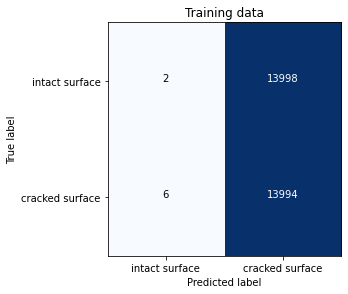

In [9]:
cm_plot_labels = ['intact surface', 'cracked surface']
plot_confusion_matrix(cm=train_cm, classes=cm_plot_labels, title='Training data')

[[   0 3000]
 [   5 2995]]


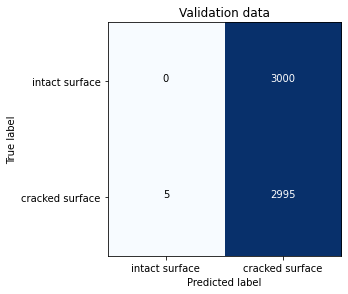

In [10]:
plot_confusion_matrix(cm=val_cm, classes=cm_plot_labels, title='Validation data')

#### Part 3: Model Deployment and Test Data Evaluation

In [4]:
# import necessary libraries for this section
import boto3
import itertools
import json
import matplotlib.pyplot as plt
import numpy as np
import sagemaker
import tensorflow as tf
import time
import os
import regex as re

from matplotlib.pyplot import imread
from sagemaker.predictor import json_deserializer
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sagemaker.tensorflow import (
    TensorFlow,
    TensorFlowModel,
    TensorFlowPredictor)

from sklearn.metrics import (
    accuracy_score,
    auc,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
    roc_auc_score)

In [11]:
# define environment variables
sess = sagemaker.Session()
role = sagemaker.get_execution_role()
bucket = sess.default_bucket()
prefix = "A3"

print("SageMaker ver: " + sagemaker.__version__)
print("Tensorflow ver: " + tf.__version__)
print("Bucket: {}".format(bucket))

SageMaker ver: 2.41.0
Tensorflow ver: 1.15.5
Bucket: sagemaker-ap-southeast-2-987959606453


In [12]:
# recall that the name of the inception-based model was: A3-inception-training-job-2021-06-16-08-59-31
best_configuration_name = 'A3-inception-training-job-2021-06-16-08-59-31'

client = boto3.client('sagemaker')
best_configuration = client.describe_training_job(TrainingJobName=best_configuration_name)
best_model_artifact = best_configuration['ModelArtifacts']['S3ModelArtifacts']
best_model_container = best_configuration['AlgorithmSpecification']['TrainingImage']

print(best_model_artifact)
print(best_model_container)

s3://sagemaker-ap-southeast-2-987959606453/A3/output/A3-inception-training-job-2021-06-16-08-59-31/output/model.tar.gz
763104351884.dkr.ecr.ap-southeast-2.amazonaws.com/tensorflow-training:2.1.0-gpu-py3


In [17]:
# download the saved model and inspect it
!aws s3 cp s3://sagemaker-ap-southeast-2-987959606453/A3/output/A3-inception-training-job-2021-06-16-08-59-31/output/model.tar.gz .
!tar -zxf model.tar.gz
!saved_model_cli show --dir 3 --all

download: s3://sagemaker-ap-southeast-2-987959606453/A3/output/A3-inception-training-job-2021-06-16-08-59-31/output/model.tar.gz to ./model.tar.gz

Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/tensorflow_p36/cpu/bin/saved_model_cli", line 8, in <module>
    sys.exit(main())
  File "/home/ec2-user/anaconda3/envs/tensorflow_p36/cpu/lib/python3.6/site-packages/tensorflow_core/python/tools/saved_model_cli.py", line 990, in main
    args.func(args)
  File "/home/ec2-user/anaconda3/envs/tensorflow_p36/cpu/lib/python3.6/site-packages/tensorflow_core/python/tools/saved_model_cli.py", line 691, in show
    _show_all(args.dir)
  File "/home/ec2-user/anaconda3/envs/tensorflow_p36/cpu/lib/python3.6/site-packages/tensorflow_core/python/tools/saved_model_cli.py", line 272, in _show_all
    tag_sets = saved_model_utils.get_saved_model_tag_sets(saved_model_dir)
  File "/home/ec2-user/anaconda3/envs/tensorflow_p36/cpu/lib/python3.6/site-packages/tensorflow_core/python/tools/

In [13]:
# configure and deploy a model endpoint
model_name = best_configuration_name

model_uri = "s3://{}/{}/output/{}/output/model.tar.gz".format(bucket, prefix, model_name)
model_endpoint_name = model_name + '-ep'

inception_model = TensorFlowModel(
    model_data=model_uri,
    role=role,
    framework_version='2.1.0')

In [16]:
# deploy the model
inception_model_predictor = inception_model.deploy(
    initial_instance_count=1,
    instance_type='ml.m4.xlarge',
    endpoint_name=model_endpoint_name
)

update_endpoint is a no-op in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


-----------!

In [21]:
# note, this is a very hacky solution due to lack of time
# rescale the test-data images like was done with the training and validation images inside the script
rescale_factor = (1.0/127.5)-1  # rescaling to [-1,1] instead of the usual [0,1]
datagen = ImageDataGenerator(rescale=rescale_factor)
img_cols = 227
img_rows = 227
input_data = ["./data/A3/test_new/p1/", "./data/A3/test_new/p2/", "./data/A3/test_new/p3/",
              "./data/A3/test_new/p4/", "./data/A3/test_new/p5/", "./data/A3/test_new/p6/"]

batches1 = datagen.flow_from_directory(input_data[0], class_mode='binary', target_size=(img_rows, img_cols),
                                             shuffle=False)
batches1.reset()
batches2 = datagen.flow_from_directory(input_data[0], class_mode='binary', target_size=(img_rows, img_cols),
                                             shuffle=False)
batches2.reset()
batches3 = datagen.flow_from_directory(input_data[0], class_mode='binary', target_size=(img_rows, img_cols),
                                             shuffle=False)
batches3.reset()
batches4 = datagen.flow_from_directory(input_data[0], class_mode='binary', target_size=(img_rows, img_cols),
                                             shuffle=False)
batches4.reset()
batches5 = datagen.flow_from_directory(input_data[0], class_mode='binary', target_size=(img_rows, img_cols),
                                             shuffle=False)
batches5.reset()
batches6 = datagen.flow_from_directory(input_data[0], class_mode='binary', target_size=(img_rows, img_cols),
                                             shuffle=False)
batches6.reset()

# serialise the JSON data from the endpoint into a Python object
# for more info see 'https://sagemaker.readthedocs.io/en/stable/api/inference/deserializers.html'
inception_model_predictor.deserializer = json_deserializer

Found 1000 images belonging to 1 classes.
Found 1000 images belonging to 1 classes.
Found 1000 images belonging to 1 classes.
Found 1000 images belonging to 1 classes.
Found 1000 images belonging to 1 classes.
Found 1000 images belonging to 1 classes.


In [22]:
# make predictions for the first 42 images in the first sub-folder (this is sth particular to AWS in that only a small
# number of observations can be predicted at a time. The better way would be to have created a batch transform job.
n = 6
all_prob_preds = []

for i in range(0, 30, n):
    print("batch: " + str((i // n) + 1) + " is " + str(i) + ":" + str(i+n))
    predictions = inception_model_predictor.predict(batches1[0][0][i:i+n])
    predictions_arr = np.array(predictions['predictions'])
    all_prob_preds = np.append(all_prob_preds, predictions_arr)
print(len(all_prob_preds))

for i in range(0, 30, n):
    print("batch: " + str((i // n) + 1) + " is " + str(i) + ":" + str(i+n))
    predictions = inception_model_predictor.predict(batches2[0][0][i:i+n])
    predictions_arr = np.array(predictions['predictions'])
    all_prob_preds = np.append(all_prob_preds, predictions_arr)
print(len(all_prob_preds))

for i in range(0, 30, n):
    print("batch: " + str((i // n) + 1) + " is " + str(i) + ":" + str(i+n))
    predictions = inception_model_predictor.predict(batches3[0][0][i:i+n])
    predictions_arr = np.array(predictions['predictions'])
    all_prob_preds = np.append(all_prob_preds, predictions_arr)
print(len(all_prob_preds))

for i in range(0, 30, n):
    print("batch: " + str((i // n) + 1) + " is " + str(i) + ":" + str(i+n))
    predictions = inception_model_predictor.predict(batches4[0][0][i:i+n])
    predictions_arr = np.array(predictions['predictions'])
    all_prob_preds = np.append(all_prob_preds, predictions_arr)
print(len(all_prob_preds))

for i in range(0, 30, n):
    print("batch: " + str((i // n) + 1) + " is " + str(i) + ":" + str(i+n))
    predictions = inception_model_predictor.predict(batches5[0][0][i:i+n])
    predictions_arr = np.array(predictions['predictions'])
    all_prob_preds = np.append(all_prob_preds, predictions_arr)
print(len(all_prob_preds))

for i in range(0, 30, n):
    print("batch: " + str((i // n) + 1) + " is " + str(i) + ":" + str(i+n))
    predictions = inception_model_predictor.predict(batches6[0][0][i:i+n])
    predictions_arr = np.array(predictions['predictions'])
    all_prob_preds = np.append(all_prob_preds, predictions_arr)
print(len(all_prob_preds))

batch: 1 is 0:6


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 2 is 6:12


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 3 is 12:18


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 4 is 18:24


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 5 is 24:30


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


30
batch: 1 is 0:6


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 2 is 6:12


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 3 is 12:18


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 4 is 18:24


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 5 is 24:30


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


60
batch: 1 is 0:6


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 2 is 6:12


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 3 is 12:18


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 4 is 18:24


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 5 is 24:30


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


90
batch: 1 is 0:6


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 2 is 6:12


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 3 is 12:18


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 4 is 18:24


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 5 is 24:30


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


120
batch: 1 is 0:6


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 2 is 6:12


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 3 is 12:18


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 4 is 18:24


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 5 is 24:30


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


150
batch: 1 is 0:6


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 2 is 6:12


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 3 is 12:18


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 4 is 18:24


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


batch: 5 is 24:30


The json_deserializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


180


In [23]:
# turn them into class predictions
all_preds = np.where(all_prob_preds > 0.5, 1, 0)
print((all_preds))

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [24]:
# save the predictions so the endpoint can be shut down
np.save('./data/A3/output/inception_preds.npy', all_preds)

In [25]:
inception_model_predictor.delete_endpoint()

In [31]:
# load the CNN_labels array, which contains the actual labels
y_test = np.load('./data/A3/output/CNN_labels2.npy')

print(y_test)

[0 1 1 0 1 1 0 0 1 0 0 1 0 0 1 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1
 0 0 0 1 0 1 0 0 0 0 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 1
 0 0 1 0 0 0 0 1 0 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0 1 0 1 1 1 0 1 0 1 0 0 1 0
 1 1 0 0 1 0 1 1 1 1 1 0 1 0 1 0 0 0 1 0 1 0 1 1 0 1 0 0 1 0 0 0 0 1 1 0 1
 0 0 0 1 1 0 1 1 0 0 1 0 0 1 0 0 1 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1]


In [32]:
# load the files
y_pred = all_preds

# calculate metrics
_, pred_freq = np.unique(y_pred, return_counts=True)
_, test_freq = np.unique(y_test, return_counts=True)

accuracy_metric = accuracy_score(y_test, y_pred)
precision_metric = precision_score(y_test, y_pred)
recall_metric = recall_score(y_test, y_pred)
auc_metric = roc_auc_score(y_test, y_pred)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
cm = confusion_matrix(y_test, y_pred)
f1_metric = f1_score(y_test, y_pred)

print("Accuracy: {}".format(round(accuracy_metric,4)))
print("Precision: {}".format(round(precision_metric,4)))
print("Recall: {}".format(round(recall_metric,4)))
print("AUC: {}".format(round(auc_metric,4)))
print("F1 score: {}".format(round(f1_metric,4)))

Accuracy: 0.5333
Precision: 0.5333
Recall: 1.0
AUC: 0.5
F1 score: 0.6957


In [33]:
def plot_confusion_matrix(cm, classes,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

[[ 0 84]
 [ 0 96]]


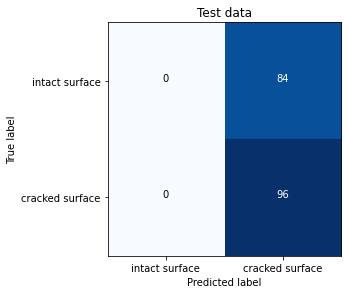

In [34]:
cm_plot_labels = ['intact surface', 'cracked surface']
plot_confusion_matrix(cm=cm, classes=cm_plot_labels, title='Test data')